In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from tensorflow import keras
import xarray as xr
import cartopy
import matplotlib.animation as animation
from datetime import datetime, timedelta
import cartopy.crs as ccrs
import cartopy.feature
from collections import Counter
from scipy.signal import detrend



In [3]:
era_data = xr.open_dataset('../files/edata_tot.nc') # TODO: change this


(576, 7, 64, 96)


/var/folders/lr/9_vb93hs6p13d2d1rwvqvdrh0000gn/T/ipykernel_11344/1693079118.py:113: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(9, 6))


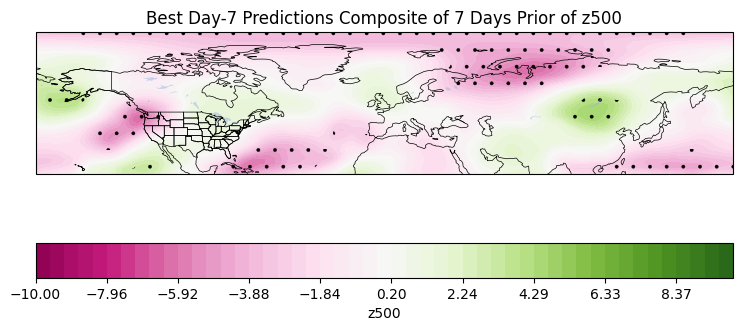

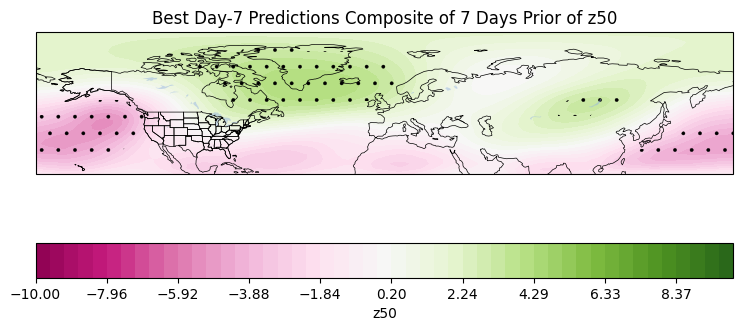

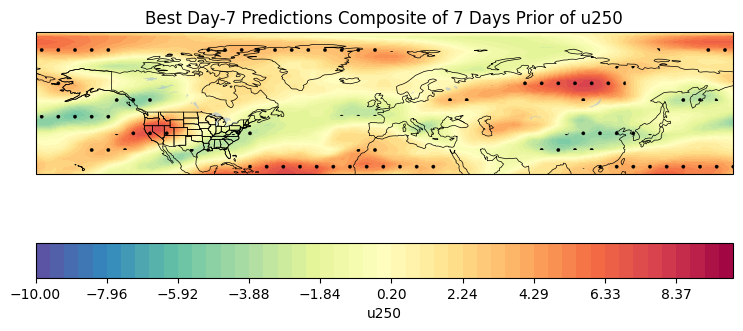

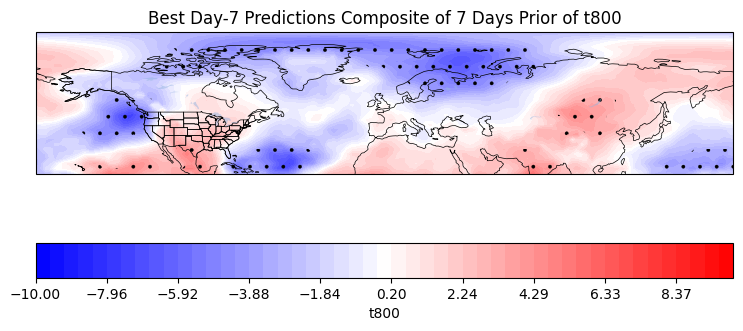

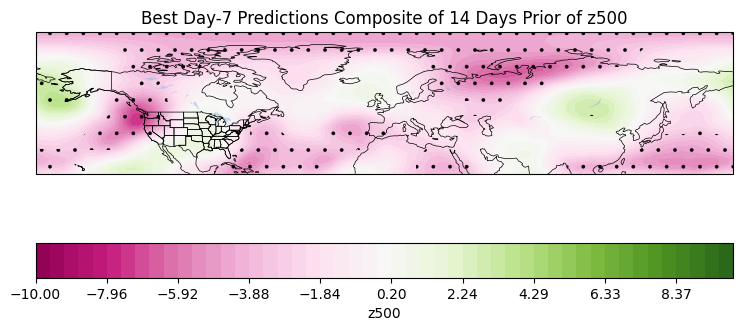

...

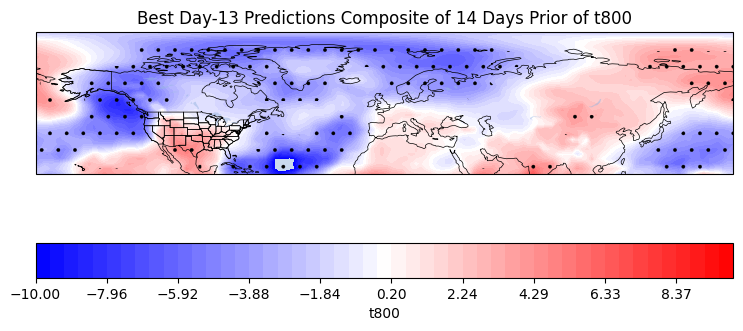

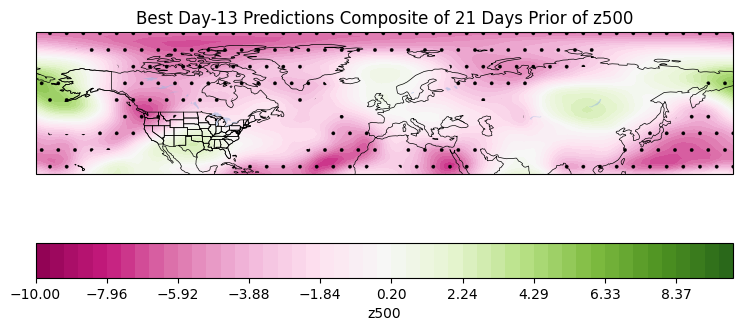

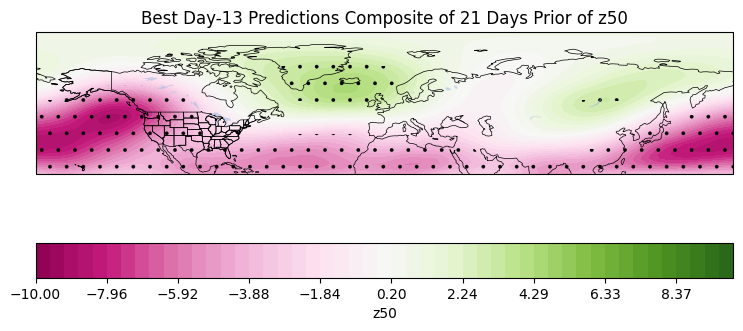

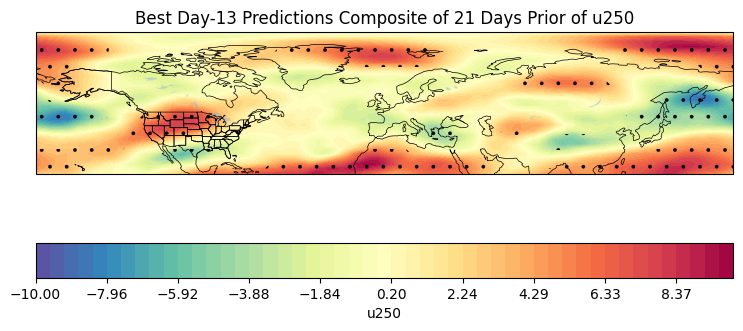

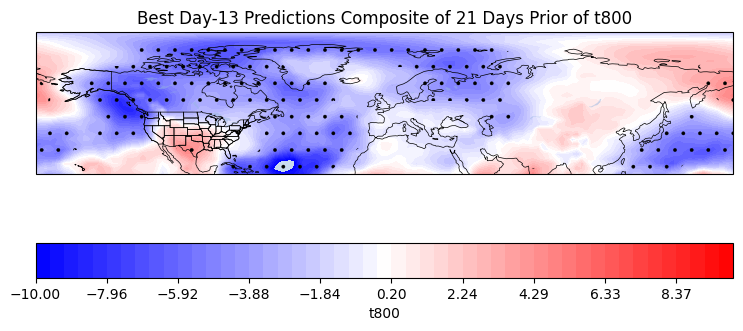

In [17]:
plt.rcParams['hatch.linewidth'] = 0.25

act = xr.open_dataset('../pper_hail_1979_2019.nc')
preds = xr.open_dataset('../files/models_wout_tele6_1.nc')
era_data = xr.open_dataset('../files/era_cin_cape_data.nc') # TODO: change this


number = 100

tmp_dtr = detrend(era_data['t800'], axis=0)
u250_dtr = detrend(era_data['u250'], axis=0)
z500_dtr = detrend(era_data['z500'], axis=0)
z50_dtr = detrend(era_data['z50'], axis=0)



lead_times = list(range(7,14))
cmaps = ['PiYG', 'PiYG', 'Spectral_r', 'bwr']

era_data['t800'] = (('time', 'lon', 'lat'), (detrend(era_data['t800'], axis=0) - tmp_dtr.mean(axis=0))/(tmp_dtr.std(axis=0)/np.sqrt(number)))
era_data['u250'] = (('time', 'lon', 'lat'), (detrend(era_data['u250'], axis=0) - u250_dtr.mean(axis=0))/(u250_dtr.std(axis=0)/np.sqrt(number)))
era_data['z500'] = (('time', 'lon', 'lat'), (detrend(era_data['z500'], axis=0) - z500_dtr.mean(axis=0))/(z500_dtr.std(axis=0)/np.sqrt(number)))
era_data['z50'] = (('time', 'lon', 'lat'), (detrend(era_data['z50'], axis=0) - z50_dtr.mean(axis=0))/(z50_dtr.std(axis=0)/np.sqrt(number)))



# levels_lst = [z50_levels, z500_levels, u250_levels, tmp_levels]


label_list = act.time.values
for i, val in enumerate(label_list):
   label_list[i] = str(val).split('T')[0]

targ_ind = np.where(label_list == label_list[57+365])[0].item()
target_data_slicer = slice(label_list[57+365], label_list[targ_ind+7])

thingy = act.sel(time=target_data_slicer).p_perfect_hail


# thingy.drop_sel(time = thingy.time[np.where(thingy.time.dt.day == 29)[0].item()])
thingy.time[np.where(thingy.time.dt.day == 29)[0].item()]
thingy.drop_sel(time = thingy.time[np.where(thingy.time.dt.day == 29)[0].item()].astype(str).item())


act.drop_sel(time = '1980-02-29')

act_arr = np.zeros(preds.hail.shape)
print(act_arr.shape)

tmp_act = act.sel(time = preds.time.values, method="nearest")

act_arr = np.zeros(preds.hail.shape)

ii = 0

for tt, day in enumerate(tmp_act.time.values):
    tslice = slice(day, day + np.timedelta64(6, 'D'))
    act_arr[tt, :, :, :93] = act.sel(time = tslice).p_perfect_hail.values[:, :64, :]


lim = 5

for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0


    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = times[val]
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = times[val]
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1


    times_to_investigate[:100]

    comp_days = [7, 14, 21]
    era_vars = ['z500', 'z50', 'u250', 't800']

    # compositing 7, 14, and 21 days prior to specific lead time
    for comp_day in comp_days:
        for vv, var in enumerate(era_vars):

            var_tmp_full = np.zeros((len(times_to_investigate[:number]), 144, 30))

            for tt, time in enumerate(times_to_investigate[:number]):
                if not(pd.to_datetime(time).month == 11):
                    var_tmp_full[tt, :, :] = era_data[var].sel(time=time -  np.timedelta64(comp_day, 'D'))

            fig = plt.figure(figsize=(9, 6))
            ax = plt.axes(projection=ccrs.PlateCarree())
            

            # Add features
            ax.add_feature(cartopy.feature.LAND, facecolor='white')
            ax.add_feature(cartopy.feature.OCEAN, alpha=0.5)
            ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.5)
            ax.add_feature(cartopy.feature.LAKES, alpha=0.5)
            ax.add_feature(cartopy.feature.STATES, linewidth=0.5)

            # Plot the data
            
            contour = plt.contourf(
                era_data.lon.values,
                era_data.lat.values,
                var_tmp_full.mean(axis=0)[:, :].T,
                transform=ccrs.PlateCarree(),
                cmap = cmaps[vv],
                levels = np.linspace(-10, 10, 50)
            )

            var_stip = np.where(np.abs(var_tmp_full.mean(axis=0)) > 2.81, 1, np.nan) # 99.5% confidence

            stipple = plt.contourf(
                era_data.lon.values,
                era_data.lat.values,
                var_stip.T, 
                colors='none', 
                hatches = '.................', 
            )
            


            plt.colorbar(contour, ax=ax, orientation='horizontal', label=str(var))
            plt.title('Best Day-'+str(lead_time)+' Predictions Composite of '+str(comp_day)+' Days Prior of '+str(var))
            # plt.show()
            plt.savefig('./composites_out/'+str(var)+'_best_day_'+str(lead_time)+'_comp_of_'+str(comp_day)+'lead_time.png')


    




Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


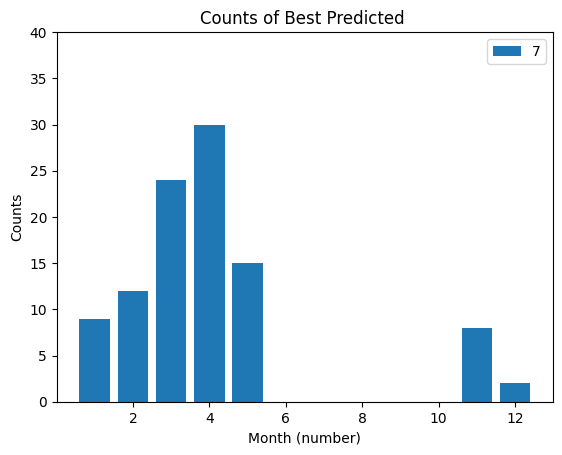

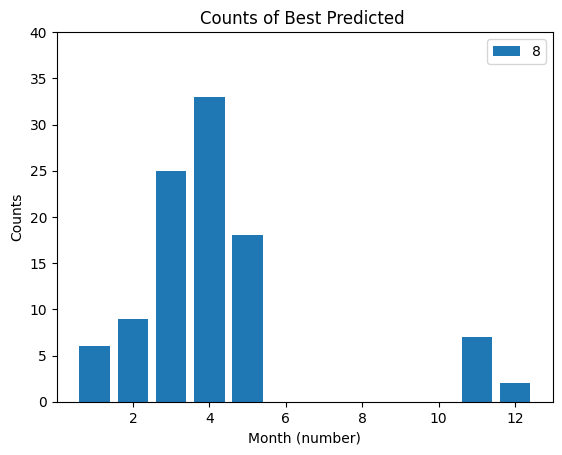

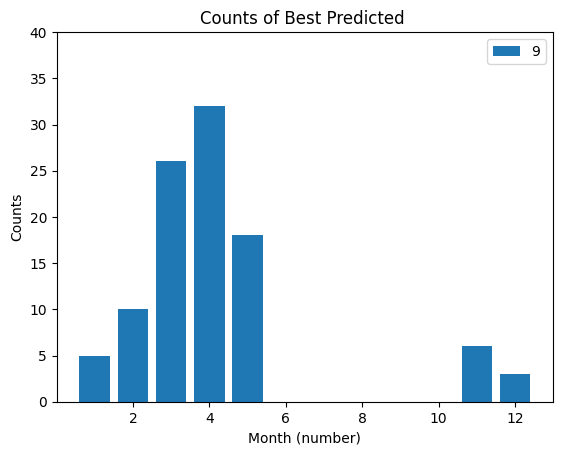

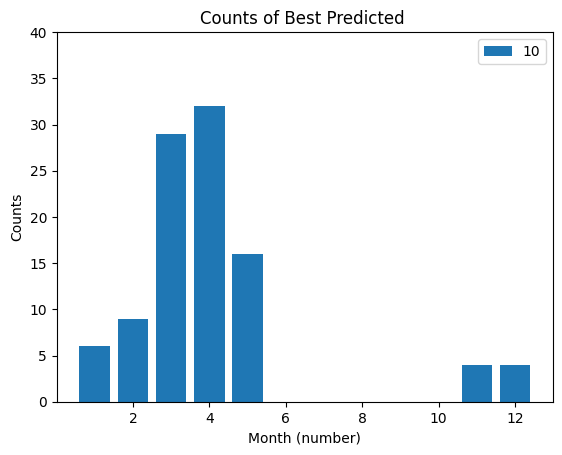

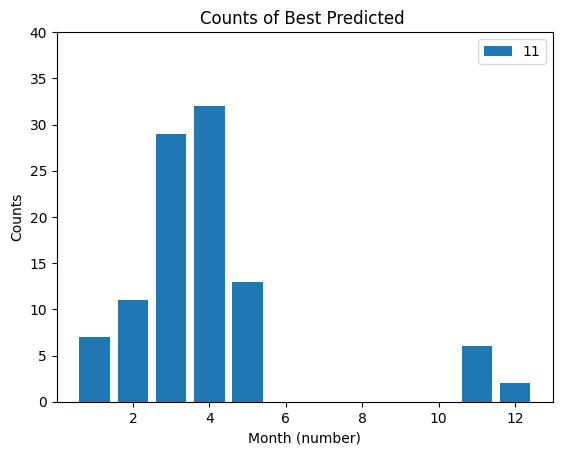

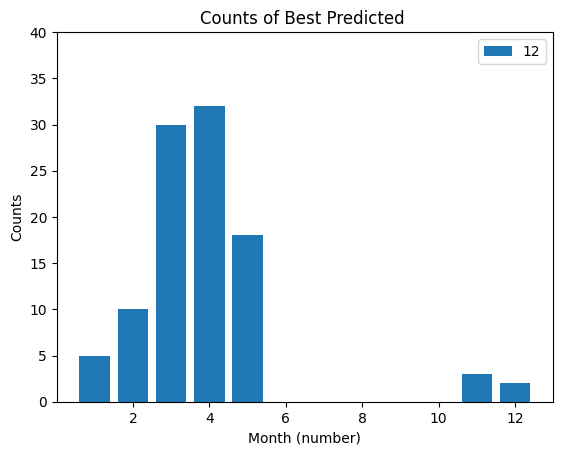

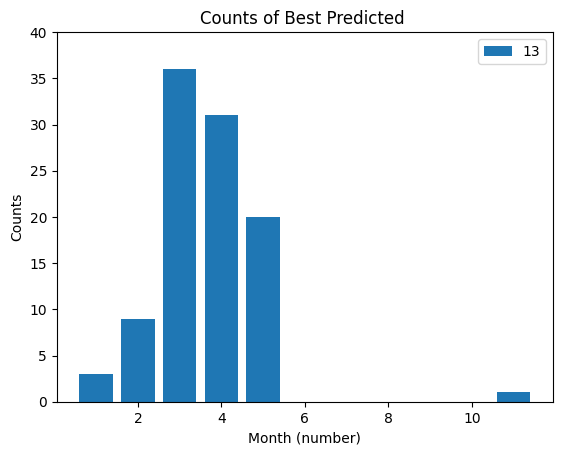

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


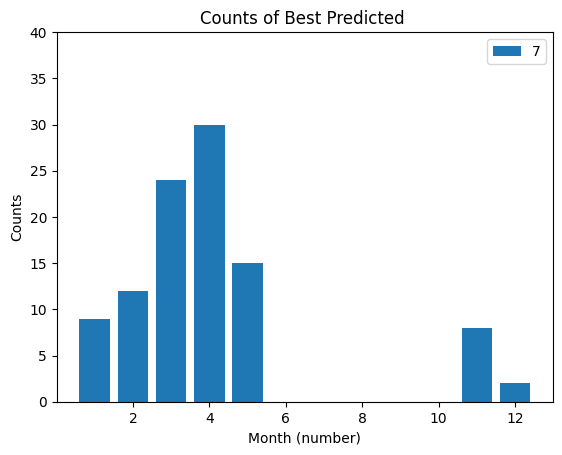

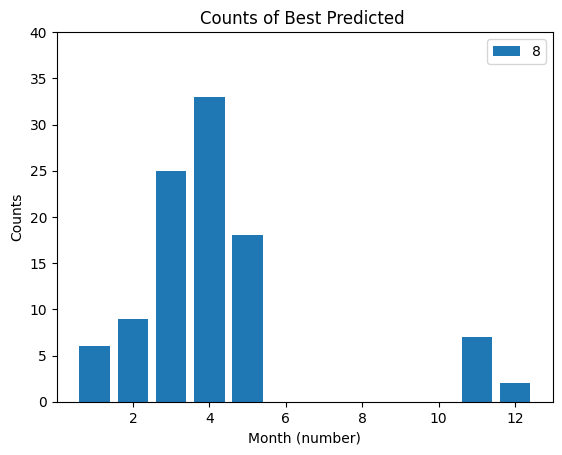

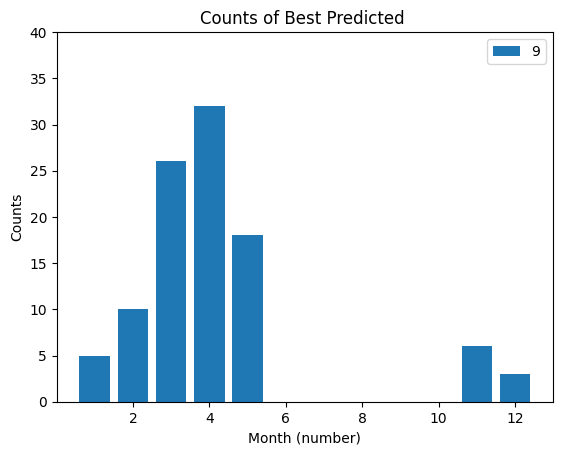

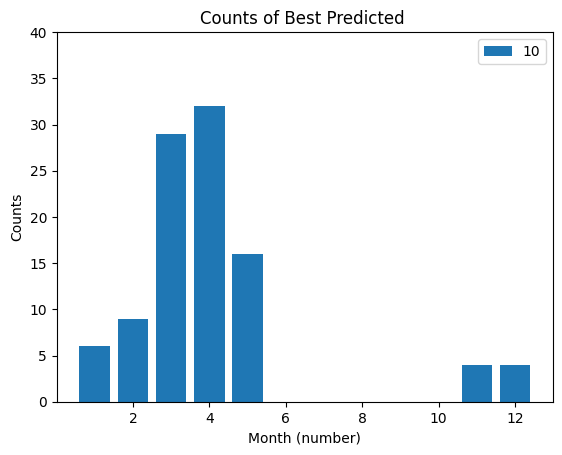

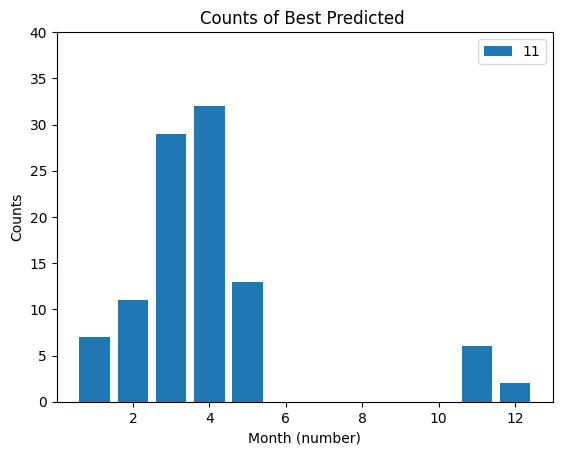

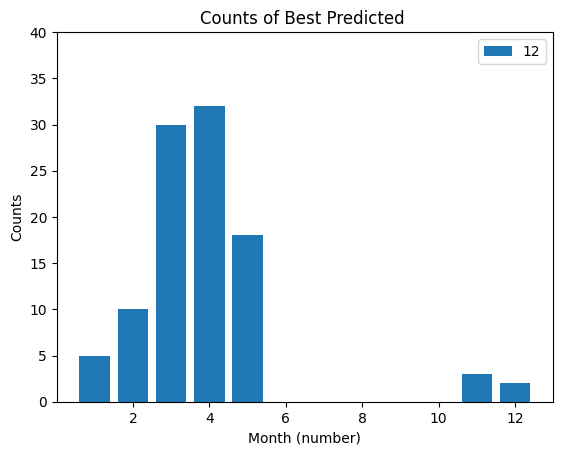

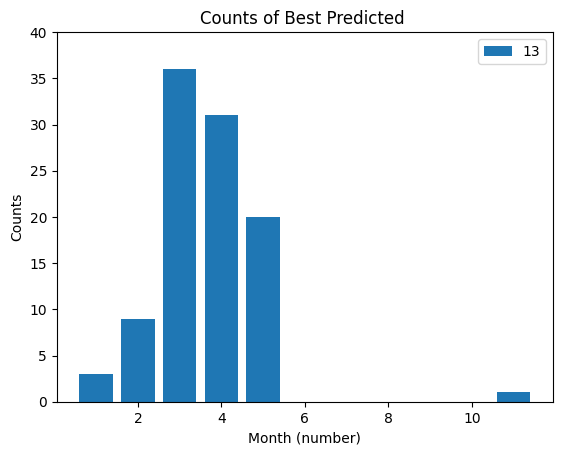

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


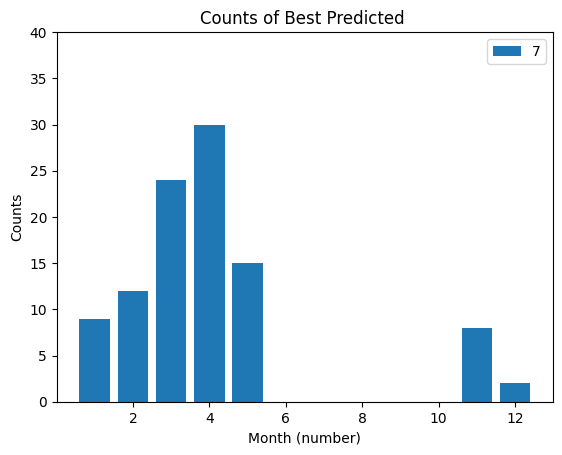

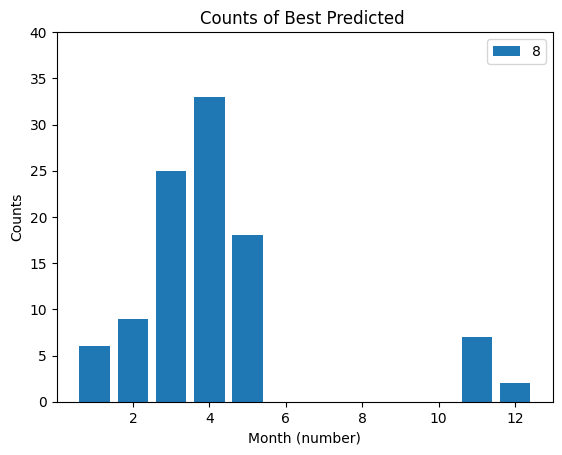

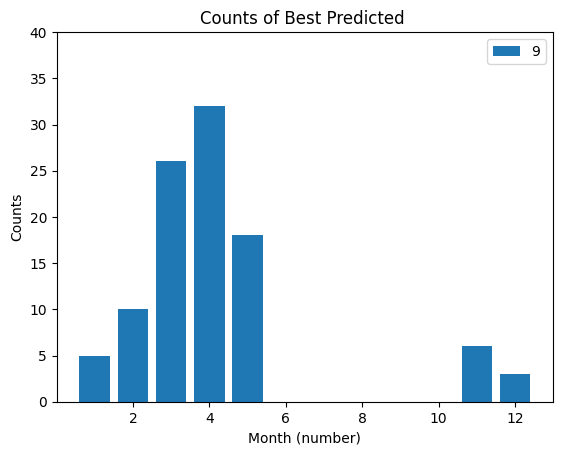

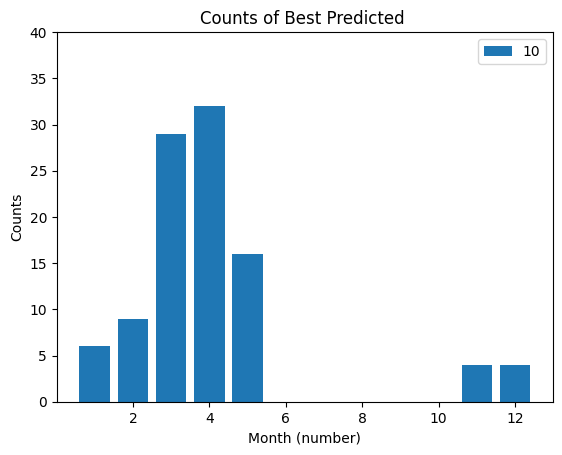

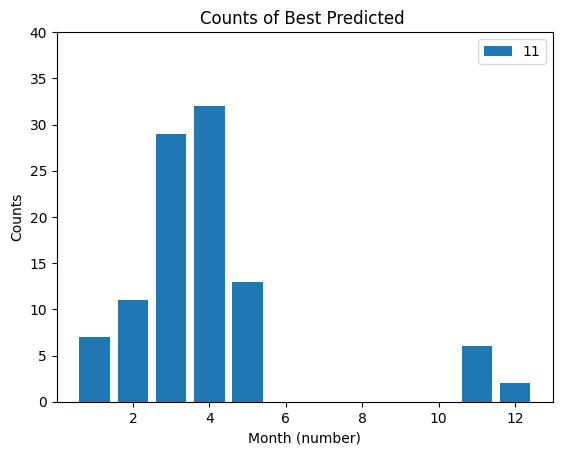

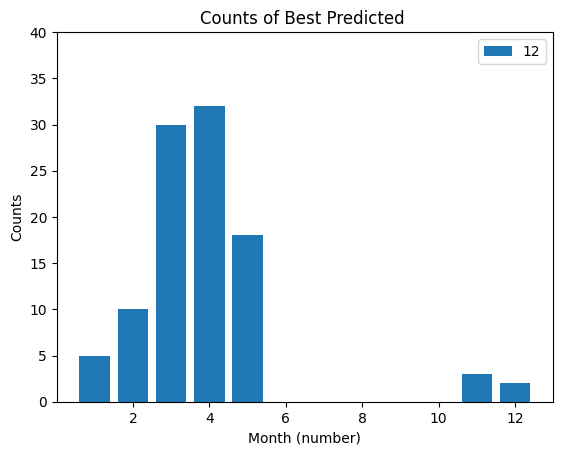

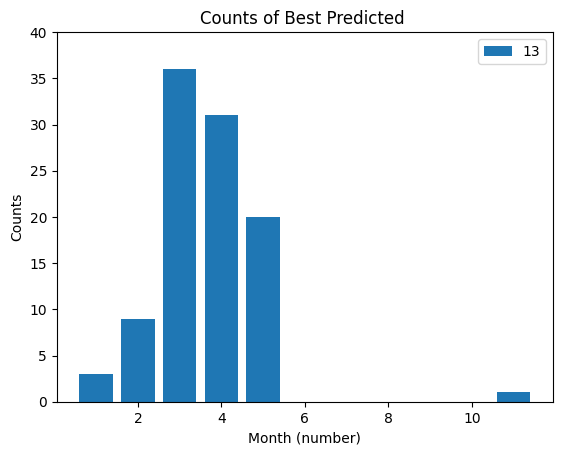

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


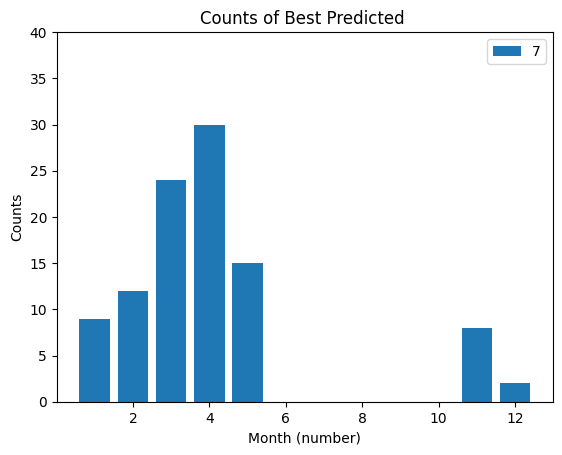

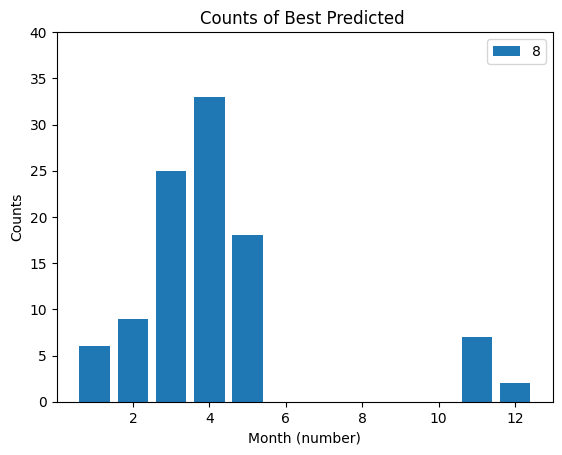

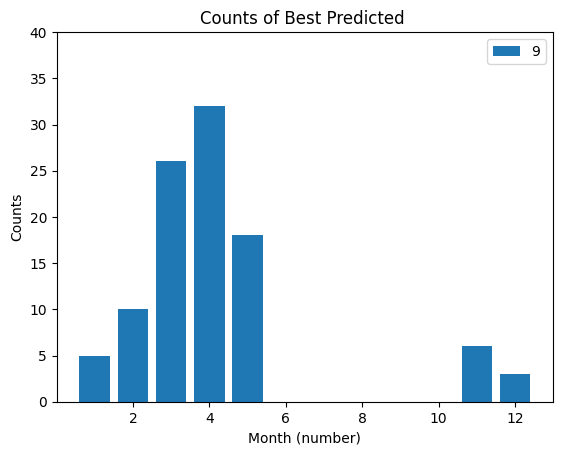

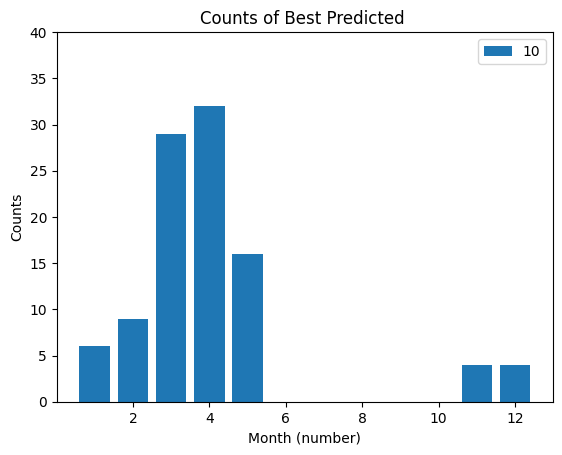

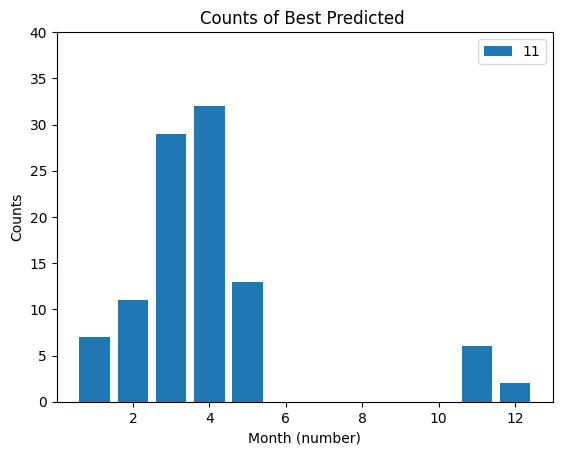

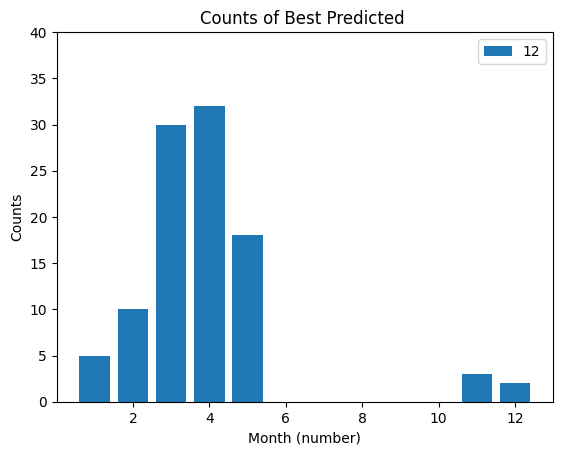

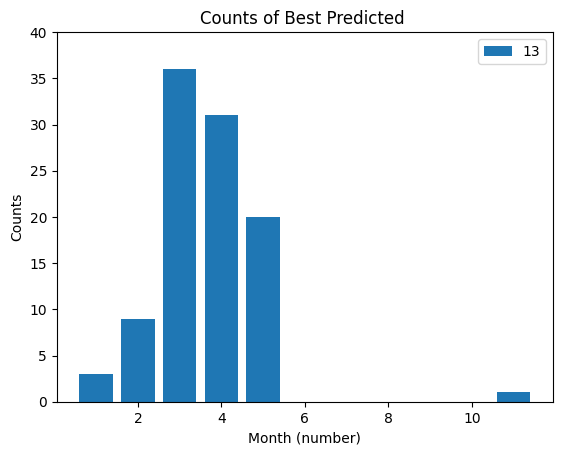

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


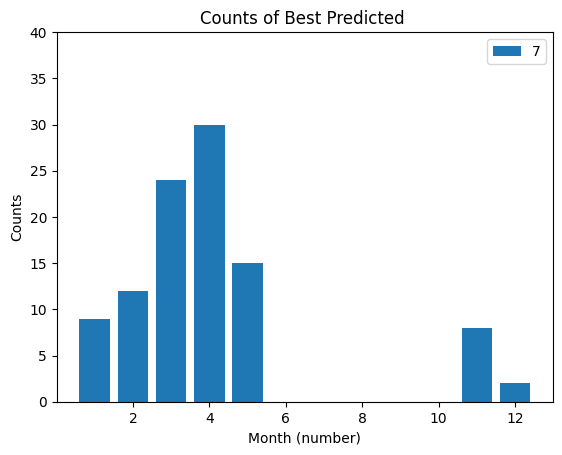

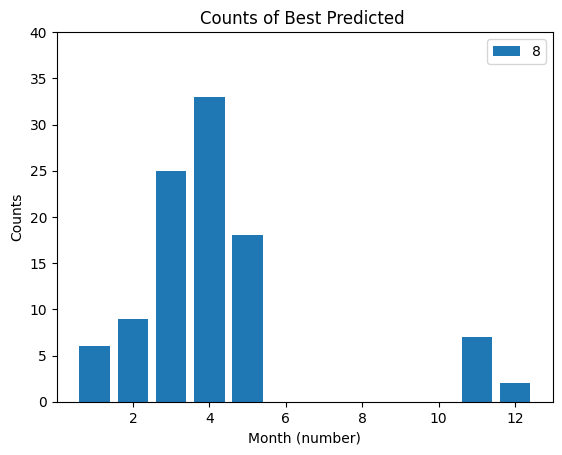

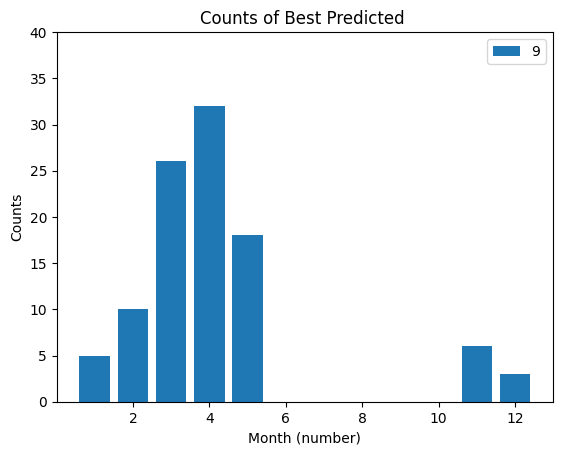

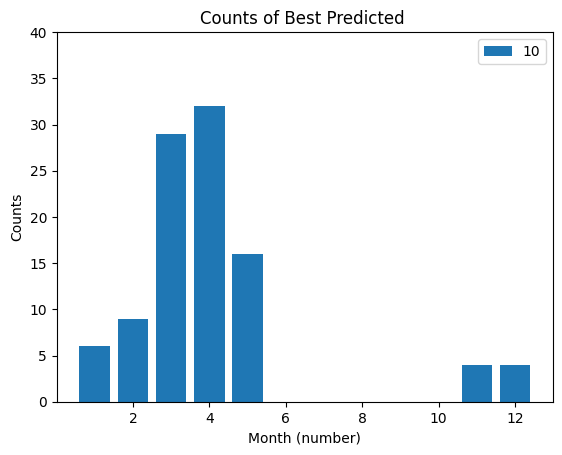

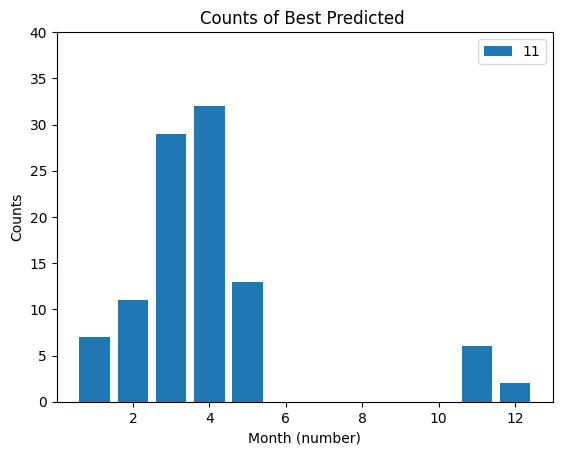

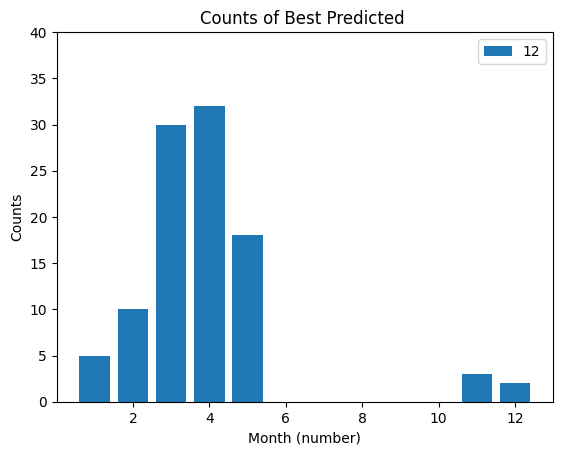

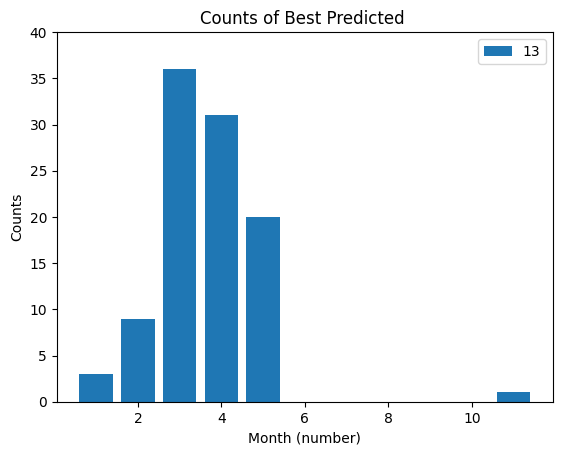

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


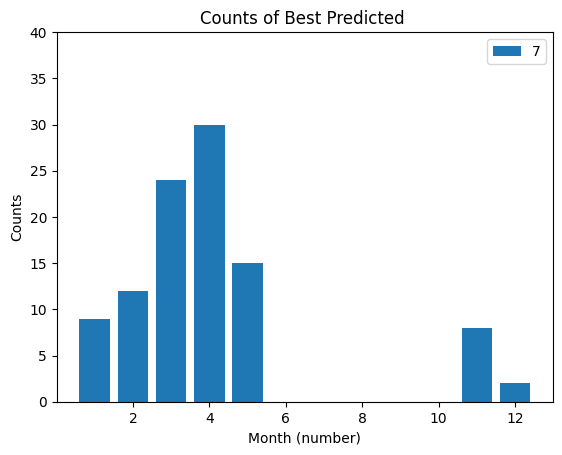

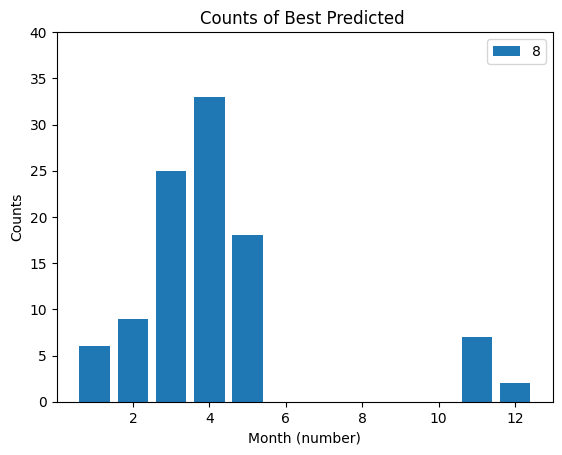

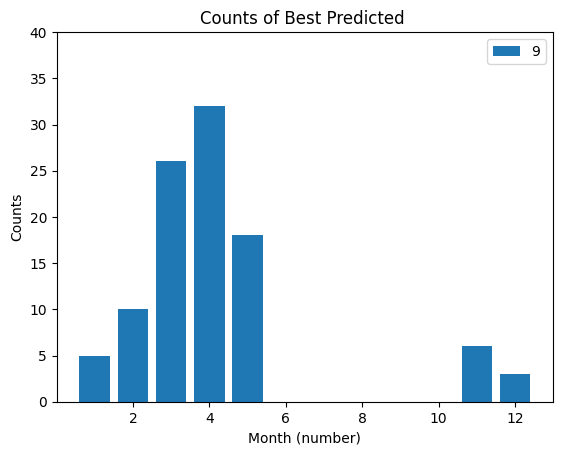

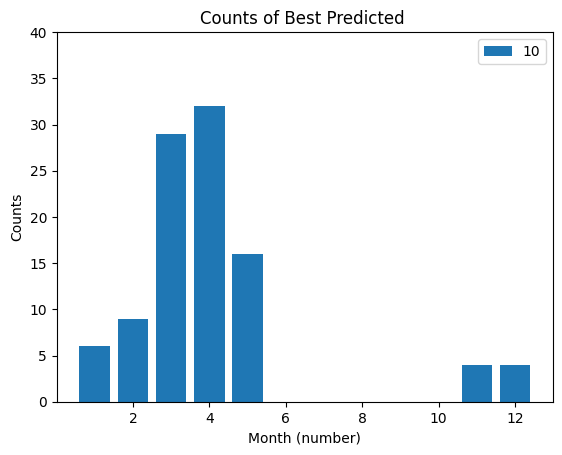

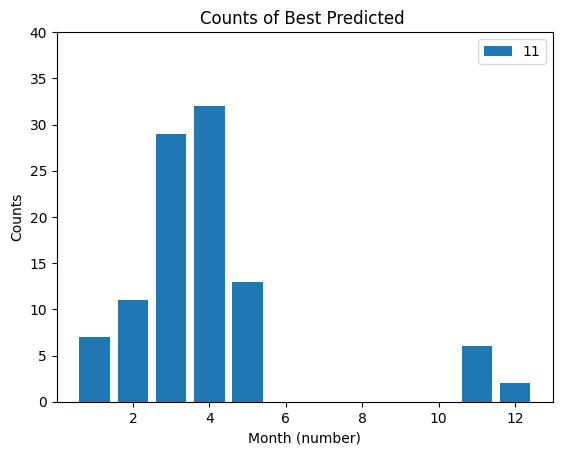

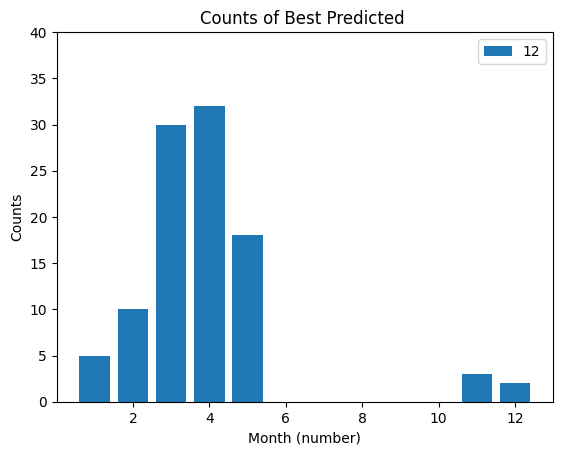

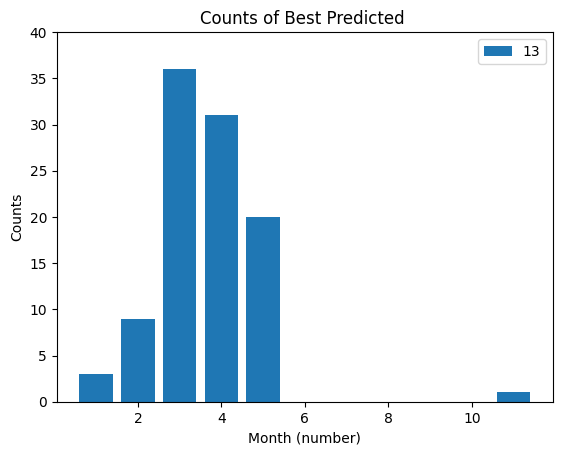

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

Counter({4: 30, 3: 24, 5: 15, 2: 12, 1: 9, 11: 8, 12: 2})
Counter({4: 33, 3: 25, 5: 18, 2: 9, 11: 7, 1: 6, 12: 2})
Counter({4: 32, 3: 26, 5: 18, 2: 10, 11: 6, 1: 5, 12: 3})
Counter({4: 32, 3: 29, 5: 16, 2: 9, 1: 6, 11: 4, 12: 4})
Counter({4: 32, 3: 29, 5: 13, 2: 11, 1: 7, 11: 6, 12: 2})
Counter({4: 32, 3: 30, 5: 18, 2: 10, 1: 5, 11: 3, 12: 2})
Counter({3: 36, 4: 31, 5: 20, 2: 9, 1: 3, 11: 1})


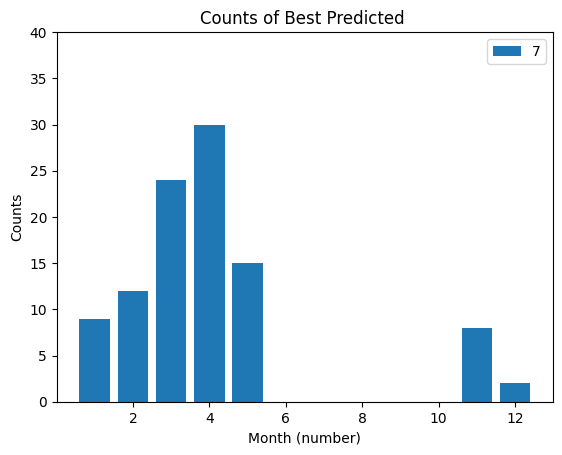

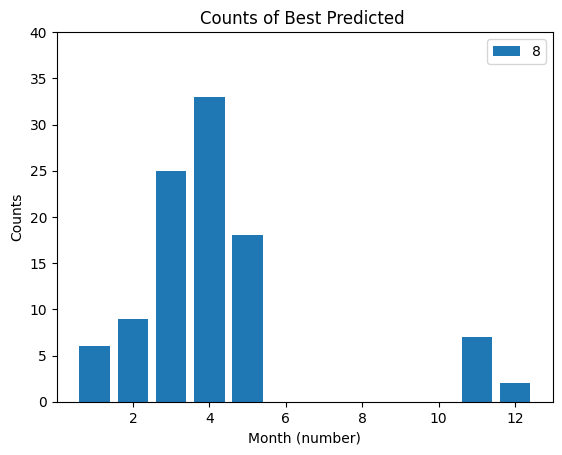

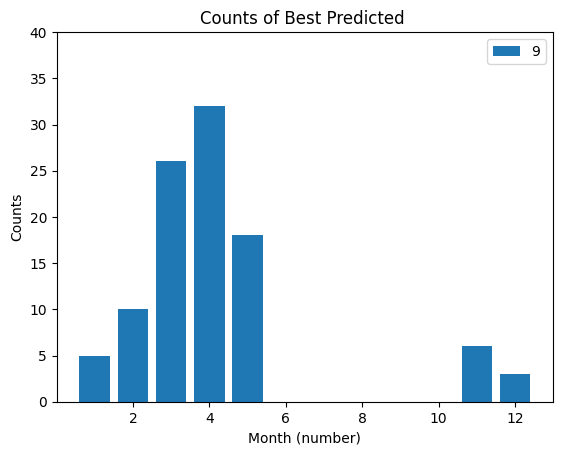

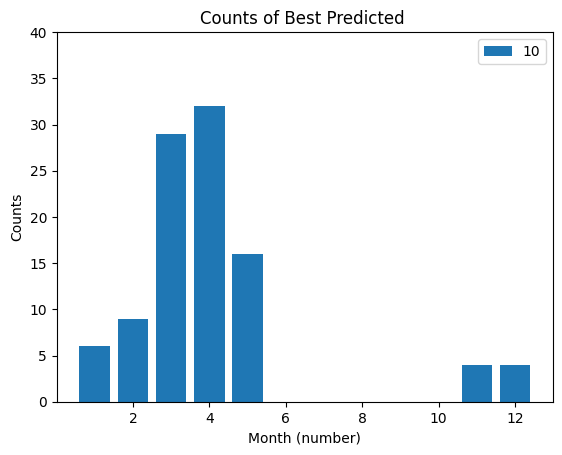

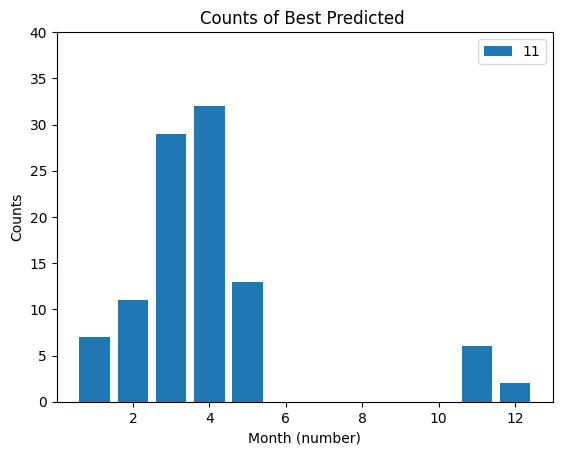

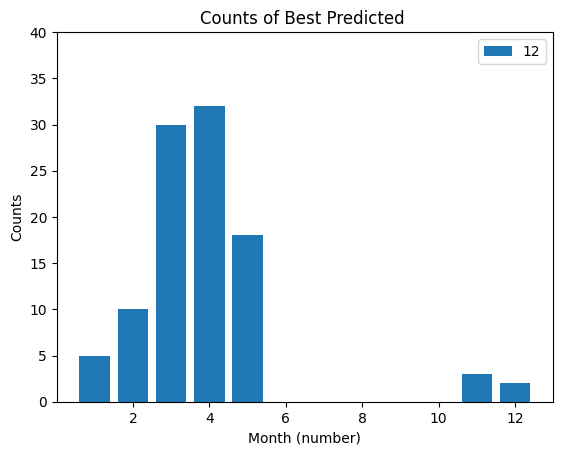

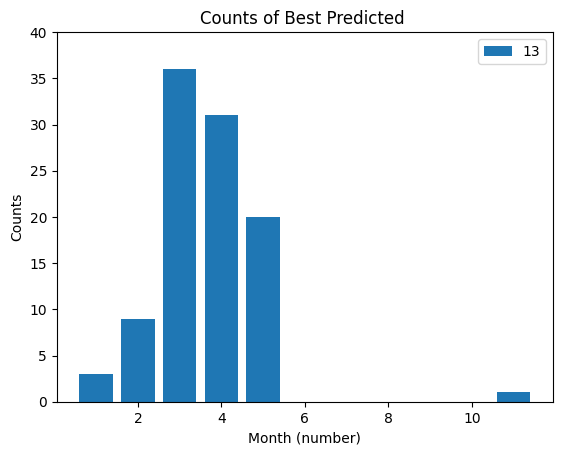

In [ ]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = pd.to_datetime(times[val]).month
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1
    
    tti_counts = Counter(times_to_investigate[:100])
    print(tti_counts)


    plt.figure()
    plt.ylim(0, 40)
    plt.bar(tti_counts.keys(), tti_counts.values(), label = lead_time)
    plt.legend()
    plt.xlabel("Month (number)")
    plt.ylabel("Counts")
    plt.title("Counts of Best Predicted ")
    

### OLR Stuff

In [4]:
olr_data = xr.open_dataset('../files/olr_avec_min15.nc') # TODO: change this
olr_data

<xarray.Dataset> Size: 264MB
Dimensions:  (time: 7632, lat: 30, lon: 144)
Coordinates:
  * lon      (lon) float64 1kB -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float64 240B 57.5 55.0 52.5 50.0 ... -7.5 -10.0 -12.5 -15.0
  * time     (time) datetime64[ns] 61kB 1983-11-01 1983-11-02 ... 2019-05-31
Data variables:
    olr      (time, lat, lon) float64 264MB ...
Attributes:
    description:  Attempt

/var/folders/lr/9_vb93hs6p13d2d1rwvqvdrh0000gn/T/ipykernel_915/174960451.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(9, 6))


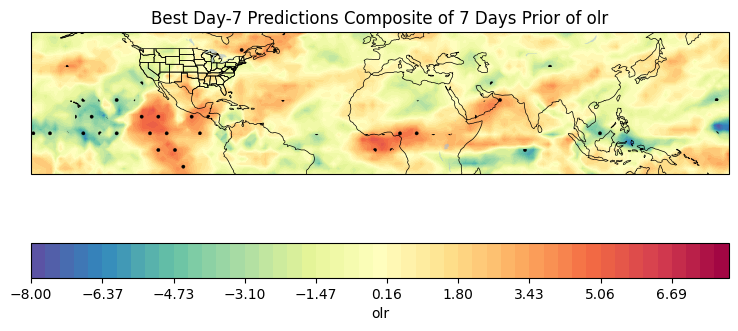

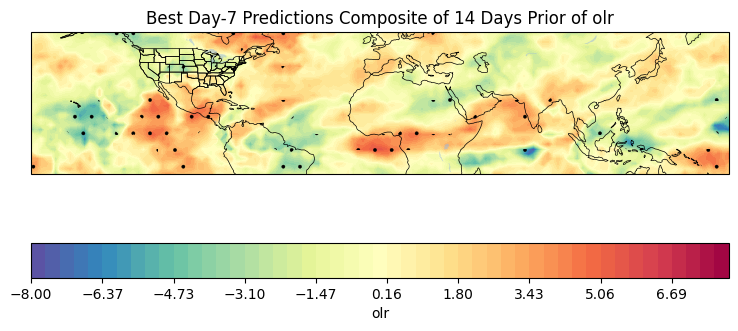

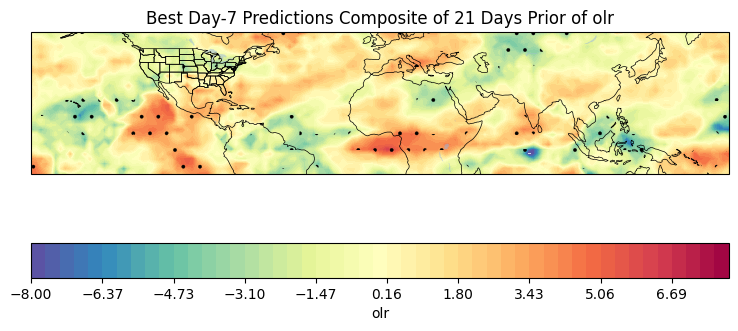

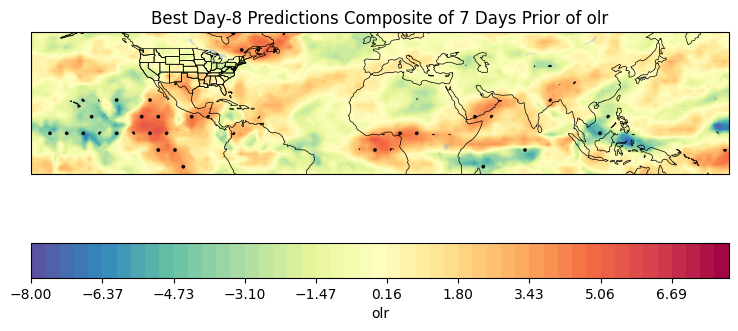

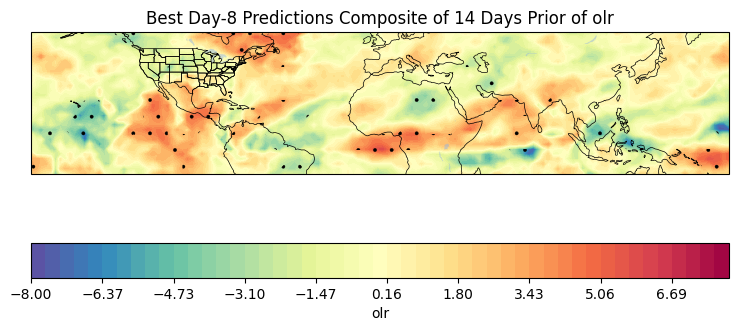

...

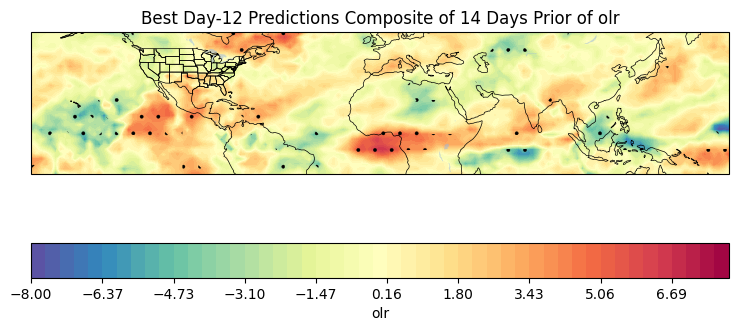

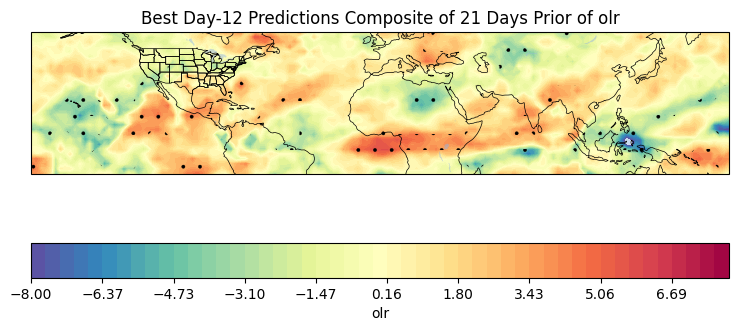

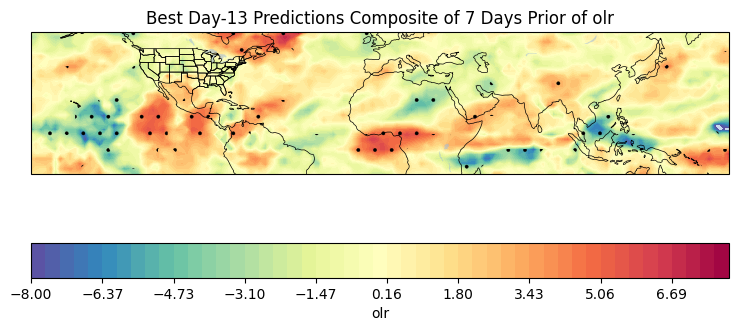

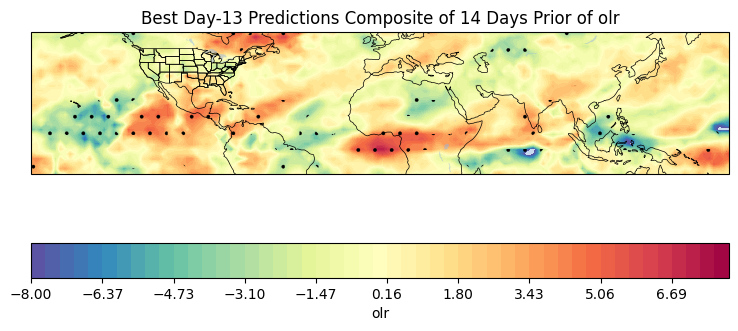

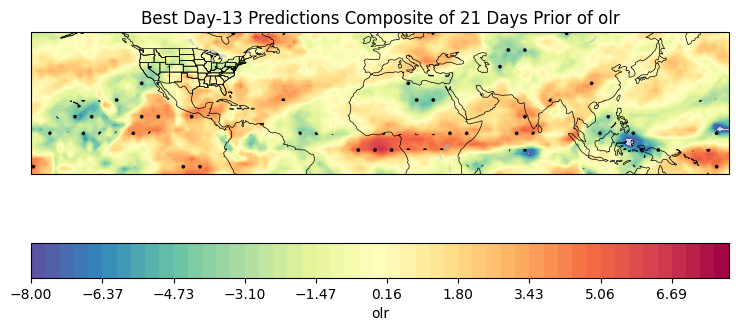

In [11]:
olr_dtr = detrend(olr_data.olr)
number = 100
olr_data['olr'] = (('time', 'lat', 'lon'), (olr_dtr - olr_dtr.mean(axis=0))/(olr_dtr.std(axis=0)/np.sqrt(number)))

for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0


    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = times[val]
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = times[val]
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1


    comp_days = [7, 14, 21]

    # compositing 7, 14, and 21 days prior to specific lead time
    for comp_day in comp_days:
        var_tmp_full = np.zeros((len(times_to_investigate[:number]), 30, 144))

        for tt, time in enumerate(times_to_investigate[:number]):
            if not(pd.to_datetime(time).month == 11):
                var_tmp_full[tt, :, :] = olr_data.olr.sel(time= time -  np.timedelta64(comp_day, 'D'))

        fig = plt.figure(figsize=(9, 6))
        ax = plt.axes(projection=ccrs.PlateCarree())

        # Add features
        ax.add_feature(cartopy.feature.LAND, facecolor='white')
        ax.add_feature(cartopy.feature.OCEAN, alpha=0.5)
        ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.5)
        ax.add_feature(cartopy.feature.LAKES, alpha=0.5)
        ax.add_feature(cartopy.feature.STATES, linewidth=0.5)

        # Plot the data
        
        contour = plt.contourf(
            olr_data.lon.values,
            olr_data.lat.values,
            var_tmp_full.mean(axis=0)[:, :],
            transform=ccrs.PlateCarree(),
            cmap = 'Spectral_r',
            levels = np.linspace(-8, 8, 50)
        )

        var_stp = np.where(np.abs(var_tmp_full.mean(axis=0)) > 2.58, 1, np.nan)

        stipple = plt.contourf(
                olr_data.lon.values,
                olr_data.lat.values,
                var_stp, 
                colors='none', 
                hatches = '.................', 
            )

        


        plt.colorbar(contour, ax=ax, orientation='horizontal', label='olr')
        plt.title('Best Day-'+str(lead_time)+' Predictions Composite of '+str(comp_day)+' Days Prior of '+'olr')
        plt.savefig('./composites_out/olr_best_day_'+str(lead_time)+'_comp_of_'+str(comp_day)+'lead_time.png')


    




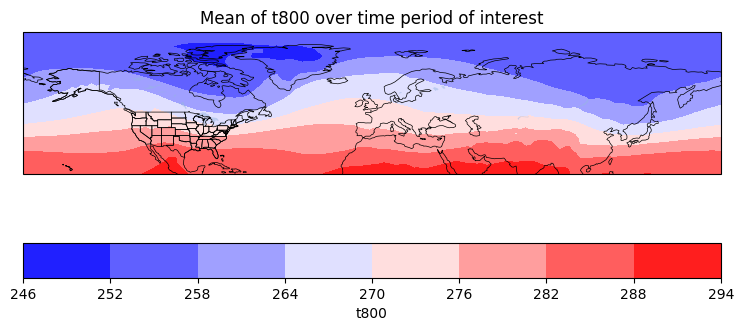

In [48]:
var = 't800'
fig = plt.figure(figsize=(9, 6))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add features
ax.add_feature(cartopy.feature.LAND, facecolor='white')
ax.add_feature(cartopy.feature.OCEAN, alpha=0.5)
ax.add_feature(cartopy.feature.COASTLINE, linewidth=0.5)
ax.add_feature(cartopy.feature.LAKES, alpha=0.5)
ax.add_feature(cartopy.feature.STATES, linewidth=0.5)

# Plot the data

contour = plt.contourf(
    era_data.lon.values,
    era_data.lat.values,
    era_data[var].mean(dim='time').T,
    transform=ccrs.PlateCarree(),
    cmap = 'bwr',
    # levels = u250_levels
)


plt.colorbar(contour, ax=ax, orientation='horizontal', label=var)
plt.title('Mean of '+var+' over time period of interest')
plt.savefig('./composites_out/olr_best_day_'+str(lead_time)+'_comp_of_'+str(comp_day)+'lead_time.png')

### Teleconnections

In [4]:
import teleconnection_data_format as telecon

In [ ]:
# formatting tele data 

tele_data = telecon.get_teleconnection_data()
keys = tele_data[0][1]
vals = tele_data[0][0]

df_e = pd.Series(dict(zip(keys, vals))).to_frame('ENSO')

df_e['NAO'] = tele_data[1][0]
df_e['MJO_disc'] = tele_data[2][0][:, 0]
df_e['MJO_cont'] = tele_data[2][0][:, 1]

df_e


,ENSO,NAO,MJO_disc,MJO_cont
1983-11-01,-1.52,1.01,3.0,0.579182
1983-11-02,-1.52,0.57,2.0,0.766059
1983-11-03,-1.52,0.37,2.0,0.975483
1983-11-04,-1.52,0.19,2.0,1.184704
1983-11-05,-1.52,0.14,2.0,1.371209
...,...,...,...,...
2019-05-27,1.35,-0.16,1.0,1.442374
2019-05-28,1.35,-0.27,2.0,1.412017
2019-05-29,1.35,-0.05,2.0,1.400609
2019-05-30,1.35,0.29,2.0,1.406497


<Figure size 640x480 with 0 Axes>

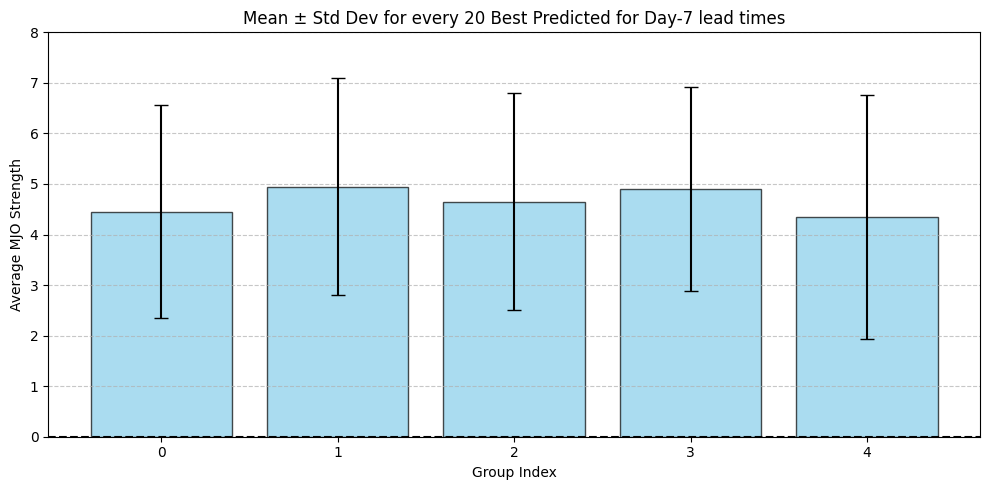

<Figure size 640x480 with 0 Axes>

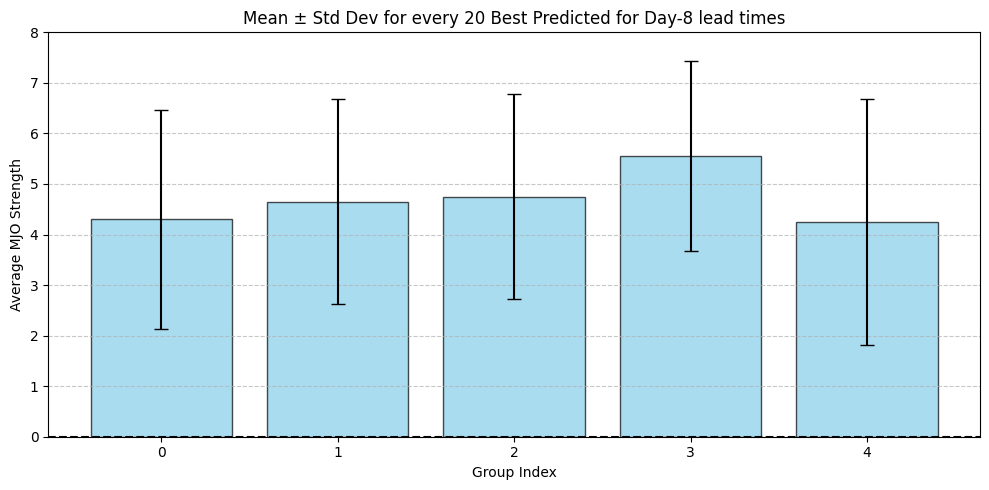

<Figure size 640x480 with 0 Axes>

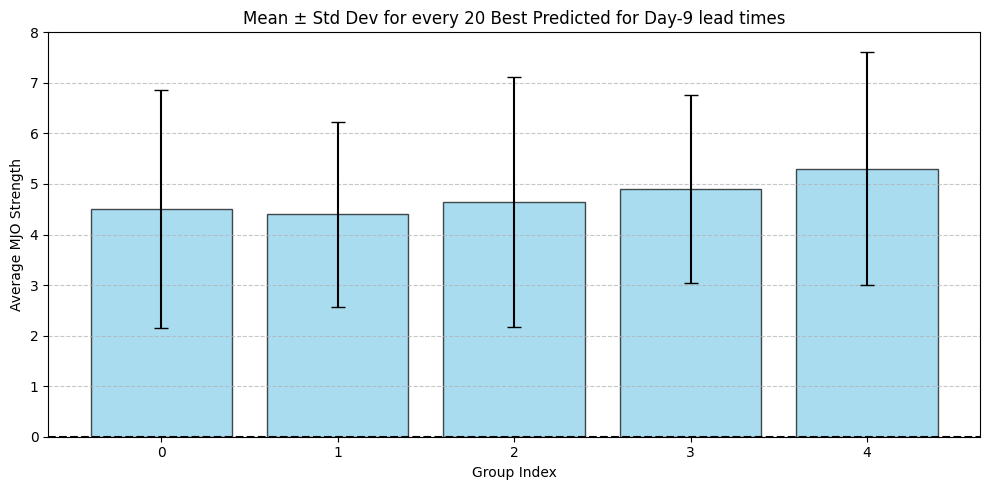

<Figure size 640x480 with 0 Axes>

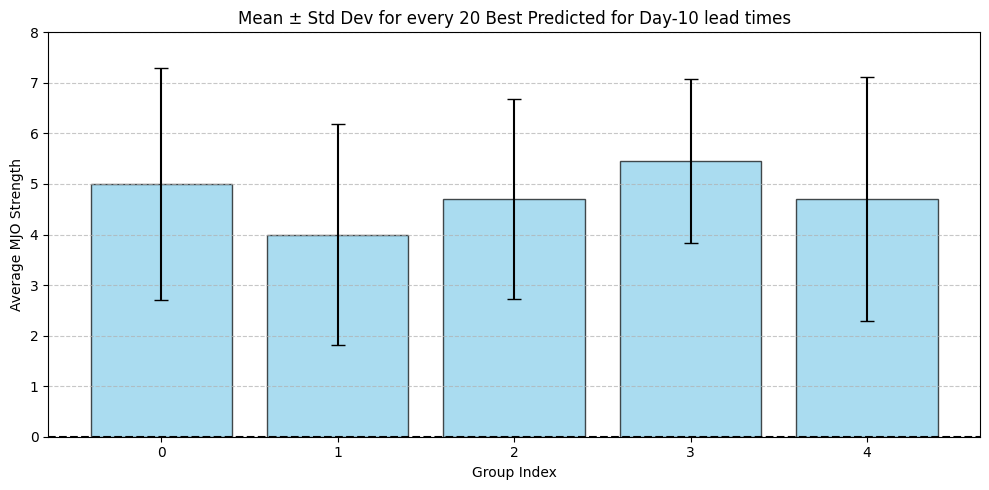

<Figure size 640x480 with 0 Axes>

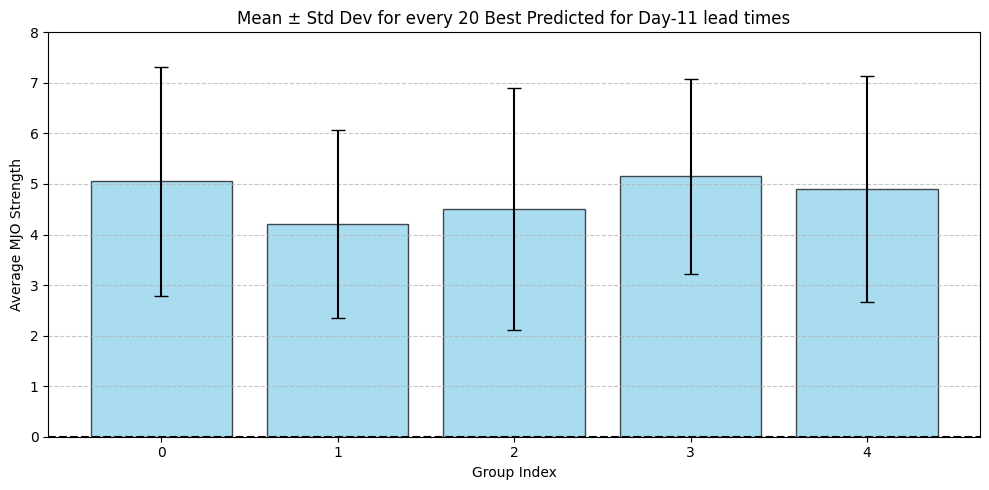

<Figure size 640x480 with 0 Axes>

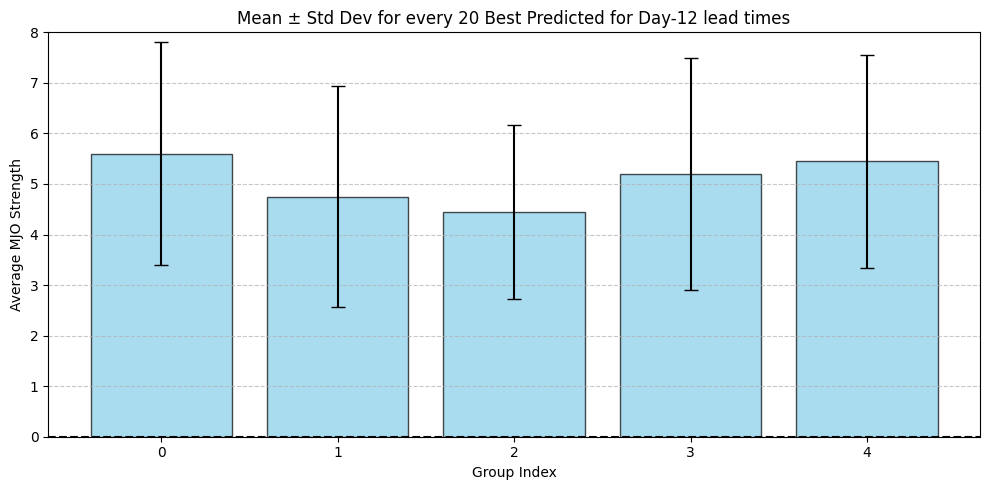

<Figure size 640x480 with 0 Axes>

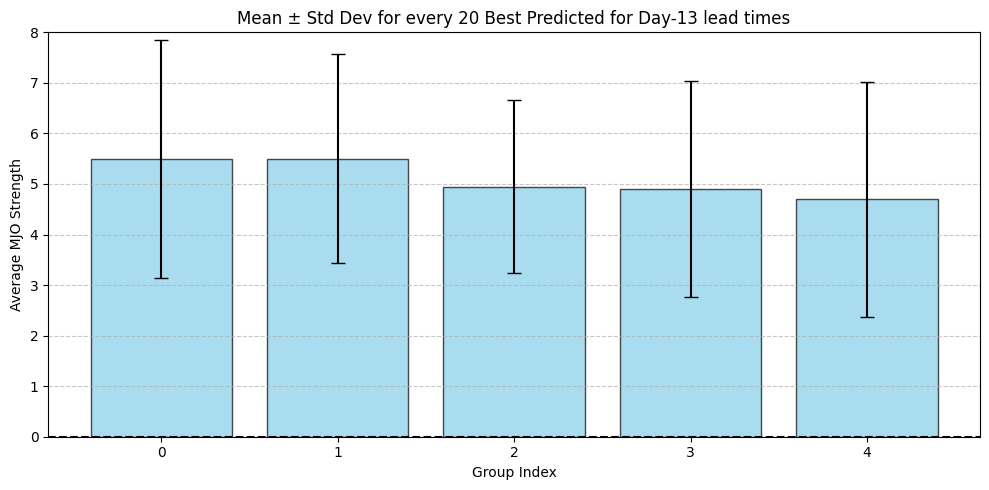

In [75]:
for lead_time in lead_times:

    pred = preds.hail.values[:, lead_time-7, :, :] # day 7 preds
    act_arr_tmp = act_arr[:, lead_time-7, :, :]
    counts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(2,1))

    pred_day_cnts = np.sum(np.all([pred >= lim, act_arr_tmp >= lim], axis = 0), axis=(1,2))
    times = preds.time.values

    s_cnts = np.sort(counts)[::-1]
    done = 0 

    counts_w_diff_ld_tm = np.zeros((555, 1))
    tot_appd = 0

    times_to_investigate = [0]*len(s_cnts)
    tti_idx = 0

    for count in s_cnts:
        if len(np.where(counts == count)[0]) > 1 and count > 0 and count != done:
            for val in np.where(counts == count)[0]:
                times_to_investigate[tti_idx] = df_e.loc[pd.Timestamp(times[val])].MJO_disc # change months enso values 
                tti_idx = tti_idx + 1
                counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val] # the amt of tot wins on that day
                tot_appd += 1
            done = count
        elif count > 0 and count != done:
            val = np.where(counts == count)[0].item()
            times_to_investigate[tti_idx] = df_e.loc[pd.Timestamp(times[val])].MJO_disc # change months enso values 
            tti_idx = tti_idx + 1
            counts_w_diff_ld_tm[tot_appd, :] = pred_day_cnts[val]
            tot_appd += 1

    plt.figure()

    # Group size
    n = 20

    data = times_to_investigate[:100]

    # Trim data to make it divisible by n
    data_trimmed = np.array(data[:len(data) - (len(data) % n)])

    # Reshape into groups of 20
    groups = data_trimmed.reshape(-1, n)

    # Calculate mean and standard deviation for each group
    means = groups.mean(axis=1)
    stds = groups.std(axis=1)

    # Plot bar chart with error bars
    x = np.arange(len(means))
    plt.figure(figsize=(10, 5))
    plt.bar(x, means, yerr=stds, capsize=5, alpha=0.7, color='skyblue', edgecolor='black')
    plt.xlabel('Group Index')
    plt.ylabel('Average MJO Strength')
    plt.title(f'Mean ± Std Dev for every {n} Best Predicted for Day-'+str(lead_time)+' lead times')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.axhline(y = 0, color='k', linestyle='--',)

    plt.ylim(0, 8)
    plt.tight_layout()
    plt.show()


    


    

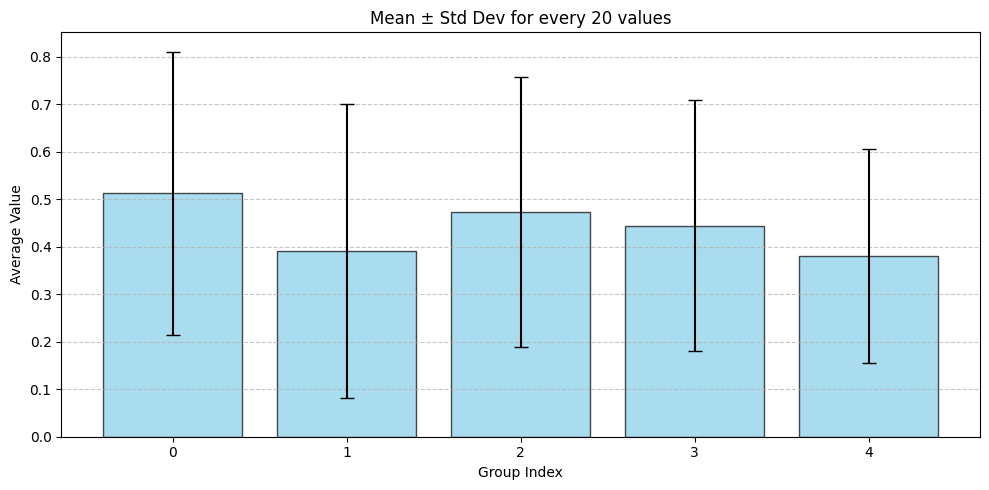

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Example list of data (replace this with your own list)
data = np.random.rand(100)  # 100 random values

# Group size
n = 20

# Trim data to make it divisible by n
data_trimmed = data[:len(data) - (len(data) % n)]

# Reshape into groups of 20
groups = data_trimmed.reshape(-1, n)

# Calculate mean and standard deviation for each group
means = groups.mean(axis=1)
stds = groups.std(axis=1)

# Plot bar chart with error bars
x = np.arange(len(means))

plt.figure(figsize=(10, 5))
plt.bar(x, means, yerr=stds, capsize=5, alpha=0.7, color='skyblue', edgecolor='black')
plt.xlabel('Group Index')
plt.ylabel('Average Value')
plt.title(f'Mean ± Std Dev for every {n} values')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0, 8)
plt.tight_layout()
plt.show()
